# SST

**Goal:**  
Comprehensive analysis and visualization of Sea Surface Temperature (SST) data comparing NEMO model output (00 benchmark cfg) against observational data. This analysis focuses on monthly climatologies (2012-2022) and examines spatial and temporal patterns across global, tropical, and polar regions.

---

## Imports

In [1]:
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import matplotlib.patheffects as path_effects
import cartopy.crs as ccrs
import cartopy.feature as cfeature

## Data

In [2]:
clim_model = xr.open_dataset('../../data/processed/model.nc')['sst']
clim_obs = xr.open_dataset('../../data/processed/combined_observations.nc')['sst']
clim_error = clim_model - clim_obs

## Plots

### Global

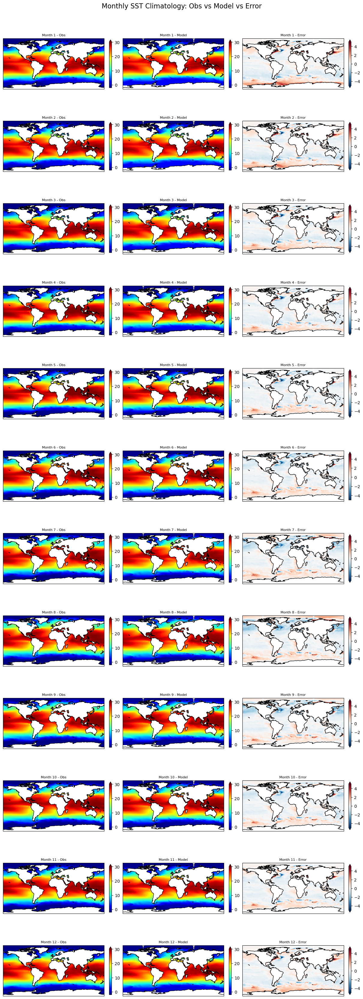

In [3]:
# 12x3 grid: 12 months, 3 data types (Obs, Model, Error)
fig, axes = plt.subplots(
    12, 3, figsize=(12, 33), 
    subplot_kw={'projection': ccrs.PlateCarree()},
    constrained_layout=True
)

plot_info = [
    (clim_obs, 'Obs', 'jet', -2, 30),
    (clim_model, 'Model', 'jet', -2, 30),
    (clim_error, 'Error', 'RdBu_r', -5, 5),
]

for i, month in enumerate(range(1, 13)):
    for j, (data, label, cmap, vmin, vmax) in enumerate(plot_info):
        ax = axes[i, j]
        pcm = data.sel(month=month).plot(
            ax=ax, cmap=cmap, vmin=vmin, vmax=vmax,
            transform=ccrs.PlateCarree(),
            add_colorbar=True, add_labels=False,
            cbar_kwargs={'shrink': 0.6}
        )
        ax.coastlines()
        ax.set_title(f'Month {month} - {label}', fontsize=8)

plt.suptitle("Monthly SST Climatology: Obs vs Model vs Error", fontsize=16, y=1.02)
plt.show()

#### Time series

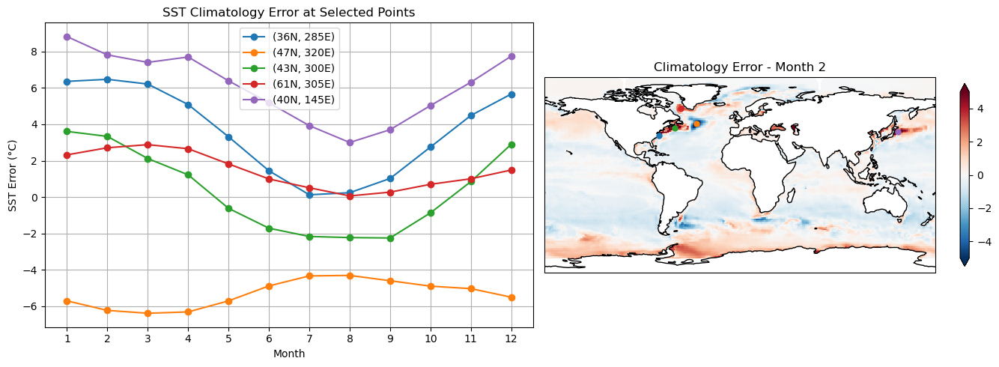

In [4]:
# Points (lat, lon) and their labels
points = [(36, 285), (47, 320), (43, 300), (61, 305), (40, 145)]
labels = [f'({lat}N, {lon}E)' for lat, lon in points]

# One axes for time series, one for map
fig = plt.figure(figsize=(14, 5))
ax_ts = plt.subplot(1, 2, 1)
ax_map = plt.subplot(1, 2, 2, projection=ccrs.PlateCarree())

# Plot time series for each point, track line colors
line_colors = []
for (lat, lon), lbl in zip(points, labels):
    ts = clim_error.sel(lat=lat, lon=lon, method='nearest')
    line, = ax_ts.plot(ts['month'], ts, 'o-', label=lbl)
    line_colors.append(line.get_color())

ax_ts.set(xlabel='Month', ylabel='SST Error (°C)',
          title='SST Climatology Error at Selected Points',
          xticks=range(1, 13))
ax_ts.legend()
ax_ts.grid(True)

# Plot map for one month
month = 2
clim_error.sel(month=month).plot(
    ax=ax_map, transform=ccrs.PlateCarree(),
    cmap='RdBu_r', vmin=-5, vmax=5,
    add_colorbar=True, add_labels=False,
    cbar_kwargs={'shrink': 0.6}
)

# Overlay points on map, color-matched to time series
for (lat, lon), c in zip(points, line_colors):
    ax_map.plot(lon, lat, 'o', color=c, ms=5, transform=ccrs.PlateCarree())

ax_map.coastlines()
ax_map.set_title(f'Climatology Error - Month {month}')

plt.tight_layout()
plt.show()

### Tropics

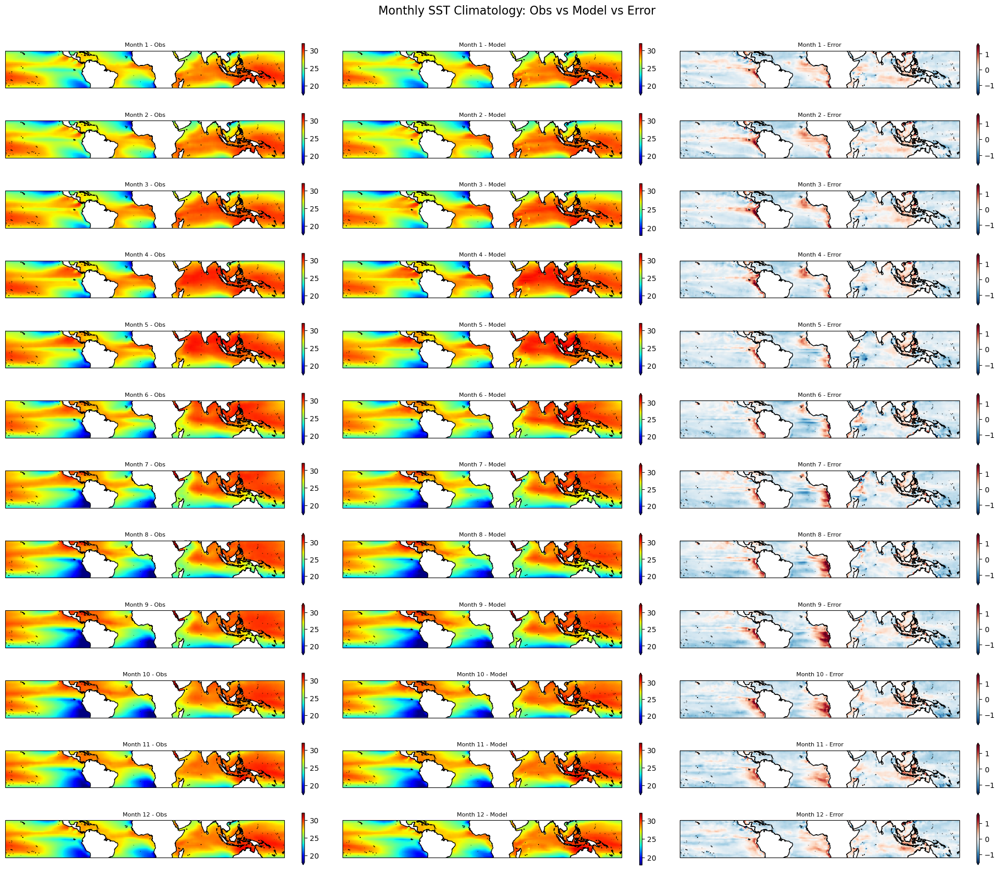

In [5]:
# 12x3 grid using GridSpec: months vs (Obs, Model, Error)
fig = plt.figure(figsize=(20, 18))
gs = gridspec.GridSpec(12, 3, figure=fig)

plot_info = [
    (clim_obs, 'Obs', 'jet', 18, 32),
    (clim_model, 'Model', 'jet', 18, 32),
    (clim_error, 'Error', 'RdBu_r', -1.5, 1.5),
]

for i, month in enumerate(range(1, 13)):
    for j, (data, label, cmap, vmin, vmax) in enumerate(plot_info):
        ax = fig.add_subplot(gs[i, j], projection=ccrs.PlateCarree())
        data_slice = data.sel(month=month, lat=slice(-23.5, 23.5))
        data_slice.plot(
            ax=ax,
            cmap=cmap,
            vmin=vmin,
            vmax=vmax,
            transform=ccrs.PlateCarree(),
            add_colorbar=True,
            add_labels=False,
            cbar_kwargs={'shrink': 0.7}
        )
        ax.coastlines()
        ax.set_title(f'Month {month} - {label}', fontsize=8)

fig.suptitle("Monthly SST Climatology: Obs vs Model vs Error", fontsize=16, y=0.94)
plt.tight_layout(rect=[0, 0, 1, 0.94])
plt.show()

#### Time series

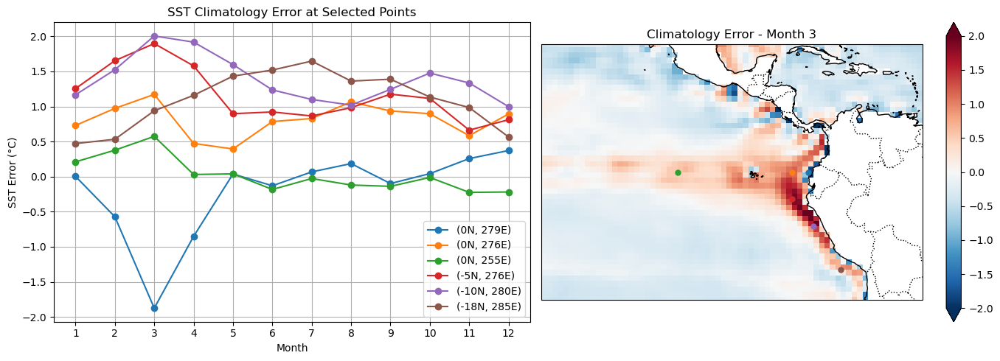

In [6]:
# Points and labels (equatorial and southern locations)
points = [(0, 279), (0, 276), (0, 255), (-5, 276), (-10, 280), (-18, 285)]
labels = [f'({lat}N, {lon}E)' for lat, lon in points]

# One axes for time series, one for map
fig = plt.figure(figsize=(14, 5))
ax_ts = plt.subplot(1, 2, 1)
ax_map = plt.subplot(1, 2, 2, projection=ccrs.PlateCarree())

# Plot time series for each point, track colors
line_colors = []
for (lat, lon), lbl in zip(points, labels):
    ts = clim_error.sel(lat=lat, lon=lon, method='nearest')
    line, = ax_ts.plot(ts['month'], ts, 'o-', label=lbl)
    line_colors.append(line.get_color())

ax_ts.set(xlabel='Month', ylabel='SST Error (°C)',
          title='SST Climatology Error at Selected Points',
          xticks=range(1, 13))
ax_ts.legend()
ax_ts.grid(True)

# Map for March, only tropical band
month = 3
clim_error.sel(month=month, lat=slice(-23.5, 23.5)).plot(
    ax=ax_map, transform=ccrs.PlateCarree(),
    cmap='RdBu_r', vmin=-2, vmax=2,
    add_colorbar=True, add_labels=False,
    cbar_kwargs={'shrink': 1.0}
)

# Overlay points, color-matched
for (lat, lon), c in zip(points, line_colors):
    ax_map.plot(lon, lat, 'o', color=c, ms=5, transform=ccrs.PlateCarree())

ax_map.coastlines()
ax_map.add_feature(cfeature.BORDERS, linestyle=':', edgecolor='black')
ax_map.set_title(f'Climatology Error - Month {month}')
ax_map.set_extent([230, 300, 23.5, -23.5], crs=ccrs.PlateCarree())

plt.tight_layout()
plt.show()

### Poles

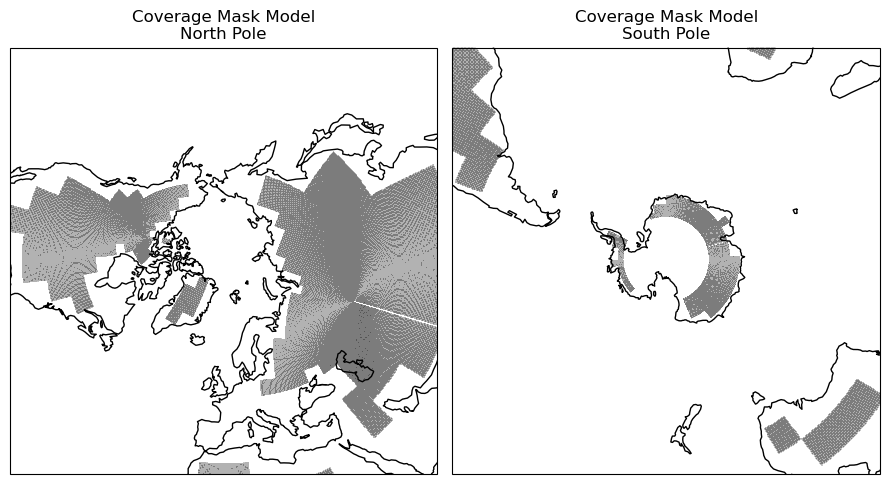

In [7]:
# Model coverage mask and meshgrid
model_original = xr.open_dataset('../../data/model/nemo00_1m_201001_202212_grid_T.nc')
coverage_mask = model_original.tos.isel(time_counter=0).notnull()
non_coverage_mask = ~coverage_mask
mesh = xr.open_dataset('../../data/model/orca05l75_domain_cfg_nemov5_10m.nc')
lonf = mesh['glamf'].values
latf = mesh['gphif'].values

# Polar mask plots
fig = plt.figure(figsize=(9, 9))
crspc = ccrs.PlateCarree()

# North Pole
ax_north = plt.subplot(1, 2, 1, projection=ccrs.NorthPolarStereo())
ax_north.set_extent([-180, 180, 30, 90], crspc)
ax_north.pcolormesh(
    lonf, latf, non_coverage_mask[1:, 1:],
    transform=crspc,
    cmap='Greys', alpha=0.3,
    shading='auto'
)
ax_north.coastlines()
ax_north.set_title('Coverage Mask Model\nNorth Pole')

# South Pole
ax_south = plt.subplot(1, 2, 2, projection=ccrs.SouthPolarStereo())
ax_south.set_extent([-180, 180, -90, -30], crspc)
ax_south.pcolormesh(
    lonf, latf, non_coverage_mask[1:, 1:],
    transform=crspc,
    cmap='Greys', alpha=0.3,
    shading='auto'
)
ax_south.coastlines()
ax_south.set_title('Coverage Mask Model\nSouth Pole')

plt.tight_layout()
plt.show()

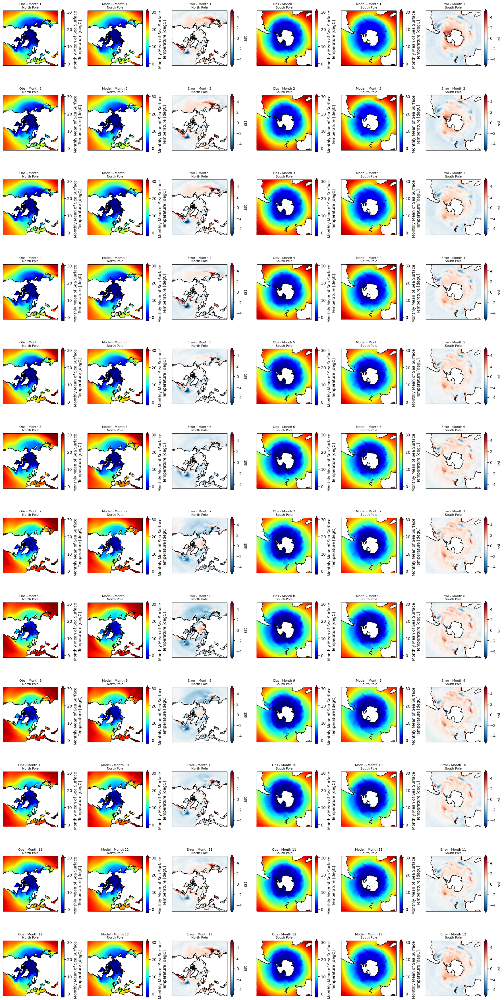

In [8]:
# North/South polar plots for (Obs, Model, Error) by month
crspc = ccrs.PlateCarree()
months = range(12)
datasets = [clim_obs, clim_model, clim_error]
titles = ['Obs', 'Model', 'Error']
vmins = [-2, -2, -5]
vmaxs = [30, 30, 5]
cmaps = ['jet', 'jet', 'RdBu_r']

fig = plt.figure(figsize=(18, 36))

for row, month in enumerate(months):
    for col, (data, title, vmin, vmax, cmap) in enumerate(zip(datasets, titles, vmins, vmaxs, cmaps)):
        # North Pole
        ax_north = plt.subplot(12, 6, row * 6 + col + 1, projection=ccrs.NorthPolarStereo())
        ax_north.set_extent([-180, 180, 30, 90], crspc)
        data.isel(month=month).plot(
            ax=ax_north, transform=crspc, vmin=vmin, vmax=vmax, cmap=cmap,
            add_colorbar=True, add_labels=True,
            cbar_kwargs={'shrink': 0.7}
        )
        ax_north.coastlines()
        ax_north.set_title(f'{title} - Month {month + 1}\nNorth Pole', fontsize=8)

        # South Pole
        ax_south = plt.subplot(12, 6, row * 6 + col + 4, projection=ccrs.SouthPolarStereo())
        ax_south.set_extent([-180, 180, -90, -30], crspc)
        data.isel(month=month).plot(
            ax=ax_south, transform=crspc, vmin=vmin, vmax=vmax, cmap=cmap,
            add_colorbar=True, add_labels=True,
            cbar_kwargs={'shrink': 0.7}
        )
        ax_south.coastlines()
        ax_south.set_title(f'{title} - Month {month + 1}\nSouth Pole', fontsize=8)

plt.tight_layout()
plt.show()

#### Mean Time series

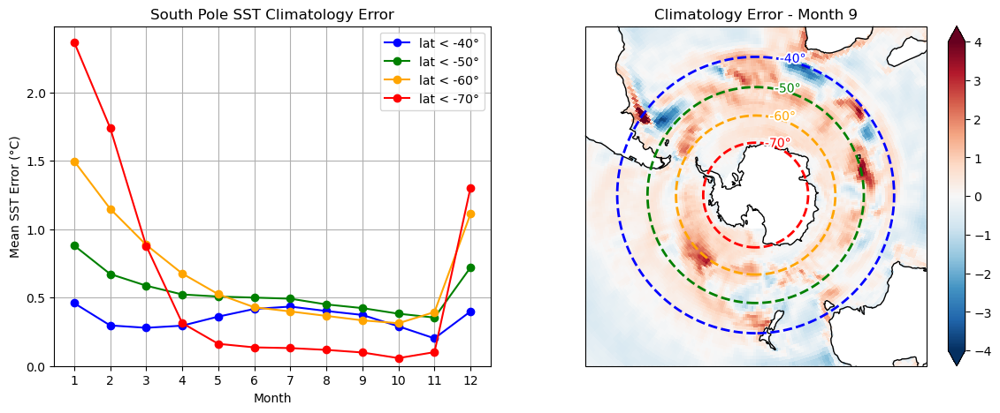

In [9]:
# Southern latitude thresholds, colors, longitude values
LAT_values = [-40, -50, -60, -70]
color_names = ['blue', 'green', 'orange', 'red']
lons = np.linspace(-180, 180, 360)

# Create axes: time series + South Polar map
fig = plt.figure(figsize=(14, 5))
ax_ts = plt.subplot(1, 2, 1)
ax_map = plt.subplot(1, 2, 2, projection=ccrs.SouthPolarStereo())

# Plot mean SST error south of each latitude
for LAT, color in zip(LAT_values, color_names):
    mask = clim_error.lat < LAT
    south_mean = clim_error.where(mask).mean(dim=["lat", "lon"])
    ax_ts.plot(south_mean['month'], south_mean, 'o-', label=f'lat < {LAT}°', color=color)

ax_ts.set(xlabel='Month', ylabel='Mean SST Error (°C)',
          title='South Pole SST Climatology Error',
          xticks=range(1, 13))
ax_ts.set_ylim(bottom=0)
ax_ts.grid(True)
ax_ts.legend()

# Map for September
month = 9
clim_error.sel(month=month).plot(
    ax=ax_map, transform=ccrs.PlateCarree(),
    cmap='RdBu_r', vmin=-4, vmax=4,
    add_colorbar=True, add_labels=False,
    cbar_kwargs={'shrink': 1.0}
)
ax_map.coastlines()
ax_map.set_extent([-180, 180, -90, -30], crs=ccrs.PlateCarree())
ax_map.set_title(f'Climatology Error - Month {month}')

# Overlay latitude lines and annotate
label_lon = 10
for LAT, color in zip(LAT_values, color_names):
    lat_line = np.full_like(lons, LAT)
    ax_map.plot(lons, lat_line, transform=ccrs.PlateCarree(),
                color=color, linewidth=2, linestyle='--')
    ax_map.text(label_lon, LAT, f"{LAT}°", color=color,
                transform=ccrs.PlateCarree(),
                fontsize=10, ha='left', va='center',
                path_effects=[path_effects.withStroke(linewidth=3, foreground='white')])